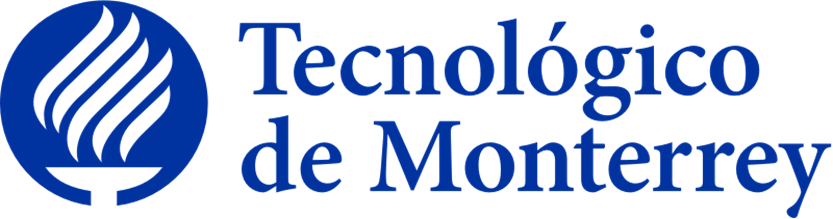

# Visión computacional para imágenes y video

## Entregable 6.4 Extracción de líneas con algoritmo de Canny

### Profesor titular: Dr. Gilberto Ochoa Ruiz
### Profesor asistente: Mtra. Yetnalezi Quintas Ruiz

* Alejandro Hahn Gallegos   A01561774
* Bernardo Mijangos Flores. A01793654
* Christian Suarez Gil .  A01793933
* Jhon Edison Muñoz Burgos.  A01793659
* Irvin Antero Gómez Esquivel . A00361034


In [12]:
# importamos las librerias
warnings.filterwarnings("ignore")
from matplotlib import image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2 as cv
import plotly.express as px
from skimage import io
from scipy import ndimage
from scipy.ndimage.filters import convolve
import warnings
import plotly
plotly.offline.init_notebook_mode()


In [13]:
# Creamos las funciones a utilizar

# Funcion de kernel gaussiano para remoción de ruido
def gaussian_kernel(size, sigma=1):
    size = int(size) // 2
    x, y = np.mgrid[-size:size+1, -size:size+1]
    normal = 1 / (2.0 * np.pi * sigma**2)
    g =  np.exp(-((x**2 + y**2) / (2.0*sigma**2))) * normal
    return g

# Filtro sober para cálculo de gradiente
def sobel_filters(img):
    Kx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], np.float32)
    Ky = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], np.float32)
    
    Ix = ndimage.filters.convolve(img, Kx)
    Iy = ndimage.filters.convolve(img, Ky)
    
    G = np.hypot(Ix, Iy)
    G = G / G.max() * 255
    theta = np.arctan2(Iy, Ix)
    
    return (G, theta)

# Funcion de supresión de No-Máximos
def non_max_suppression(img, D):
    M, N = img.shape
    Z = np.zeros((M,N), dtype=np.int32)
    angle = D * 180. / np.pi
    angle[angle < 0] += 180

    
    for i in range(1,M-1):
        for j in range(1,N-1):
            try:
                q = 255
                r = 255
                
               #angle 0
                if (0 <= angle[i,j] < 22.5) or (157.5 <= angle[i,j] <= 180):
                    q = img[i, j+1]
                    r = img[i, j-1]
                #angle 45
                elif (22.5 <= angle[i,j] < 67.5):
                    q = img[i+1, j-1]
                    r = img[i-1, j+1]
                #angle 90
                elif (67.5 <= angle[i,j] < 112.5):
                    q = img[i+1, j]
                    r = img[i-1, j]
                #angle 135
                elif (112.5 <= angle[i,j] < 157.5):
                    q = img[i-1, j-1]
                    r = img[i+1, j+1]

                if (img[i,j] >= q) and (img[i,j] >= r):
                    Z[i,j] = img[i,j]
                else:
                    Z[i,j] = 0

            except IndexError as e:
                pass
    
    return Z

# Función para implementación de doble treshold
def threshold(img, lowThresholdRatio=0.05, highThresholdRatio=0.09):
    
    highThreshold = img.max() * highThresholdRatio
    lowThreshold = highThreshold * lowThresholdRatio
    
    M, N = img.shape
    res = np.zeros((M,N), dtype=np.int32)
    
    weak = np.int32(25)
    strong = np.int32(255)
    
    strong_i, strong_j = np.where(img >= highThreshold)
    zeros_i, zeros_j = np.where(img < lowThreshold)
    
    weak_i, weak_j = np.where((img <= highThreshold) & (img >= lowThreshold))
    
    res[strong_i, strong_j] = strong
    res[weak_i, weak_j] = weak
    
    return (res)

# Funcion para aplicar Hysteresis
def hysteresis(img, weak = 75, strong=255):
    M, N = img.shape  
    for i in range(1, M-1):
        for j in range(1, N-1):
            if (img[i,j] == weak):
                try:
                    if ((img[i+1, j-1] == strong) or (img[i+1, j] == strong) or (img[i+1, j+1] == strong)
                        or (img[i, j-1] == strong) or (img[i, j+1] == strong)
                        or (img[i-1, j-1] == strong) or (img[i-1, j] == strong) or (img[i-1, j+1] == strong)):
                        img[i, j] = strong
                    else:
                        img[i, j] = 0
                except IndexError as e:
                    pass
    return img

def complete_process_var_sigma(image, sigma):
    kernel_size = 3
    img_gaussian = convolve(image, gaussian_kernel(kernel_size, sigma))
    G, theta = sobel_filters(img_gaussian)
    img_nonmax = non_max_suppression(G, theta)
    img_threshold = threshold(img_nonmax)
    img_final = hysteresis(img_threshold)
    return img_final
    

## a) modificar el valor de sigma y observa los cambios en las lineas detectadas

Realizamos inicialmente la lectura de una imagen para este punto:

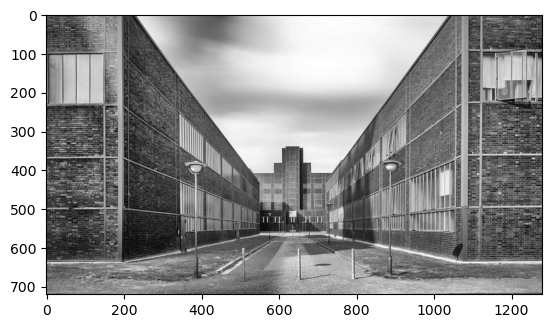

In [14]:
image = io.imread('https://mott.pe/noticias/wp-content/uploads/2017/09/Escenarios-desde-otra-perspectiva-en-im%C3%A1genes-en-blanco-y-negro-de-Frank-Waterkotlle-compressor-1280x720.png') 
image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
imgplot = plt.imshow(image,cmap=plt.cm.gray)
plt.show()

In [15]:
list_images = [image]
sigmas =[5,11,15]
for sigma in sigmas:
    canny_image = complete_process_var_sigma(image, sigma)
    list_images.append(canny_image)




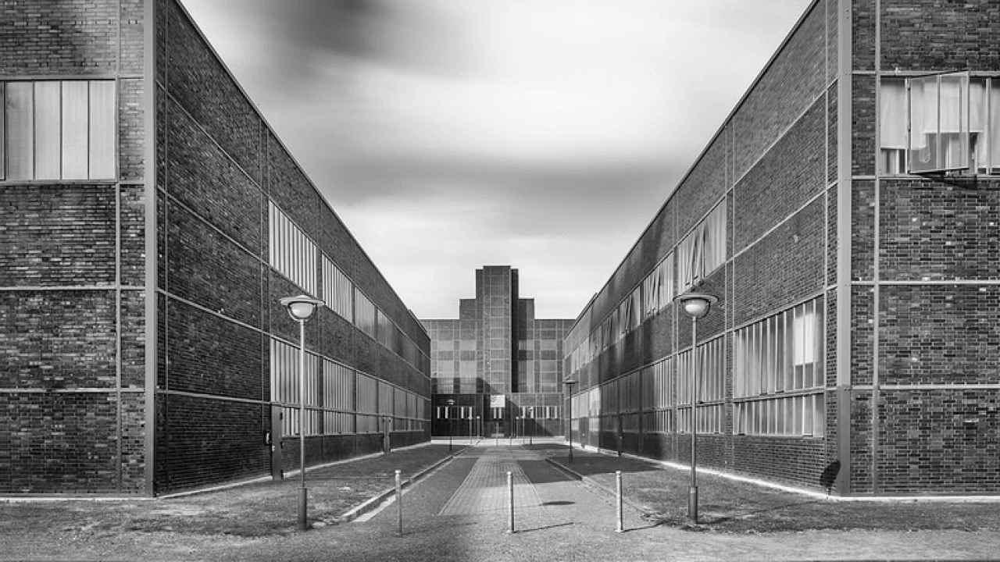
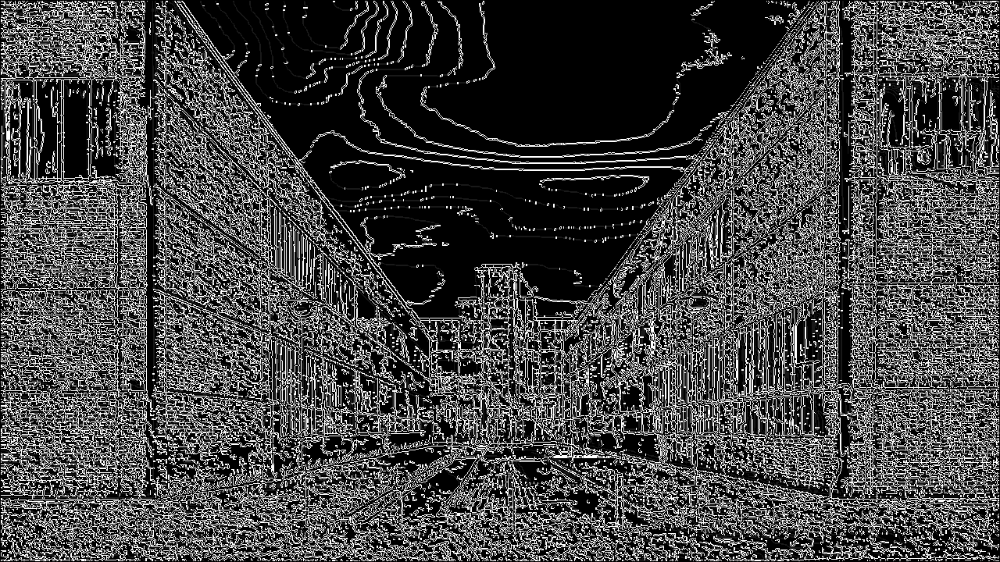
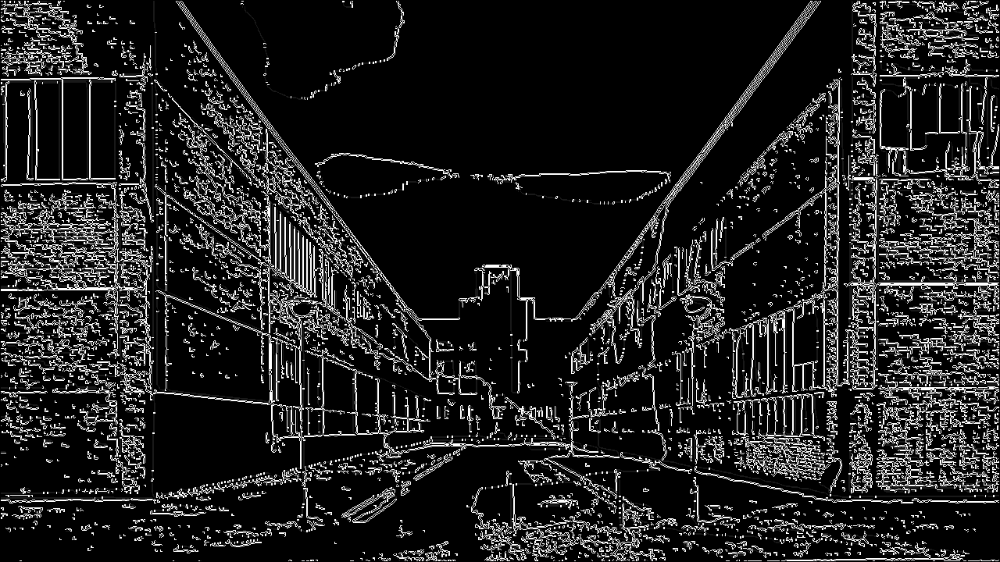
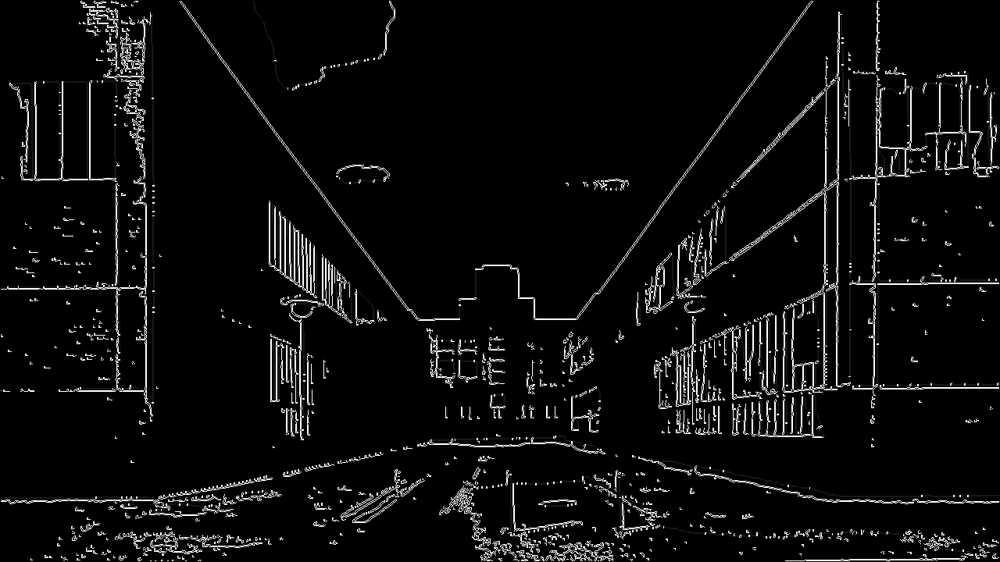

In [16]:
lista_figuras = ['Sigma 11','Sigma 15','Original','Sigma 5']
fig = px.imshow(np.array(list_images), facet_col=0, binary_string=True,title='Aplicación Canny Detector',facet_col_wrap=2)
for i, titulo in enumerate(lista_figuras):
    fig.layout.annotations[i]['text'] = titulo
fig.update_layout(height=1000)
fig.show()

En la imagen anterior podemos observar como a un mayor valor de Sigma en el Kernel Gaussiano, pasamos de detectar lineas finas con un alto nivel de detalle a lineas más gruesas de contorno de los edificios. Por lo cual se concluye que este es un parámetro crítico en este método de extracción de orden, dado que los resultados dependerán intensamente del valor de sigma escogido según la necesidad.

## b) Analiza el comportamiento del Canny Detector con y sin remoción de ruido

Ahora vamos a analizar el comportamiento del detector, sin implementar el suavizado Gaussiano para remoción de ruido y a compararlo con uno de las implementaciones del ejercicio anterior, usando el Kernel Gaussiano con Sigma = 5 (bajo)

In [17]:
def complete_process_no_gaussian(image):
    G, theta = sobel_filters(image)
    img_nonmax = non_max_suppression(G, theta)
    img_threshold = threshold(img_nonmax)
    img_final = hysteresis(img_threshold)
    return img_final


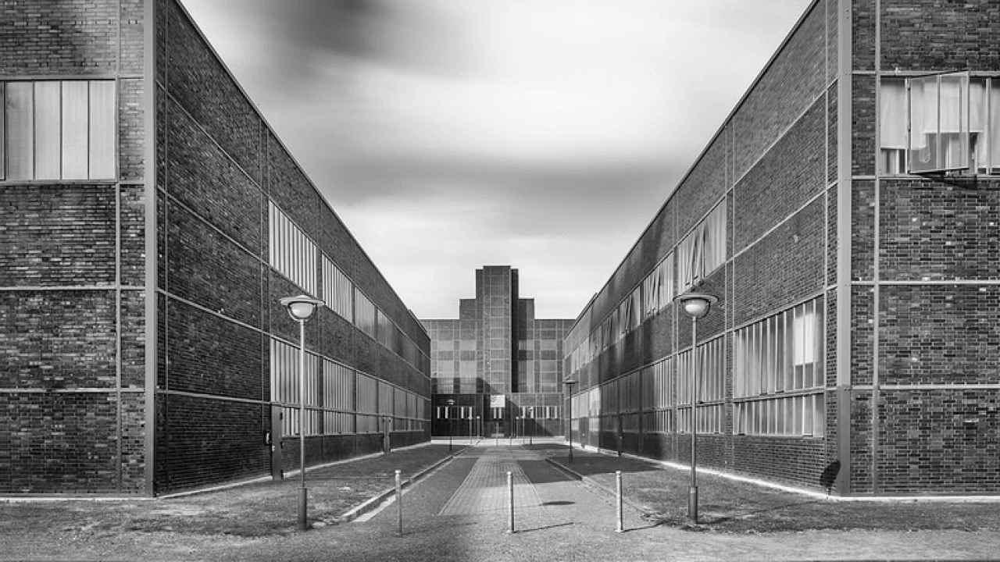
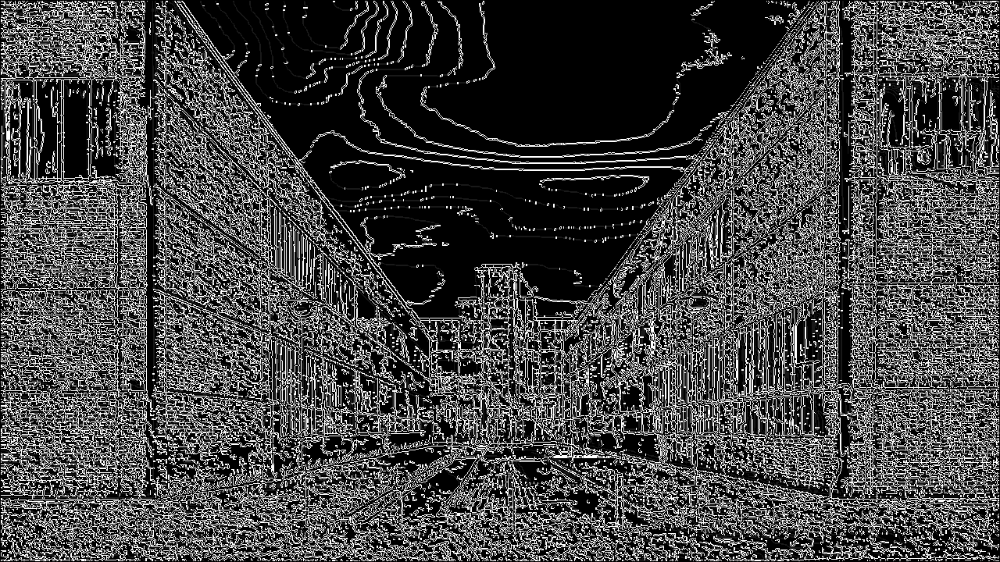
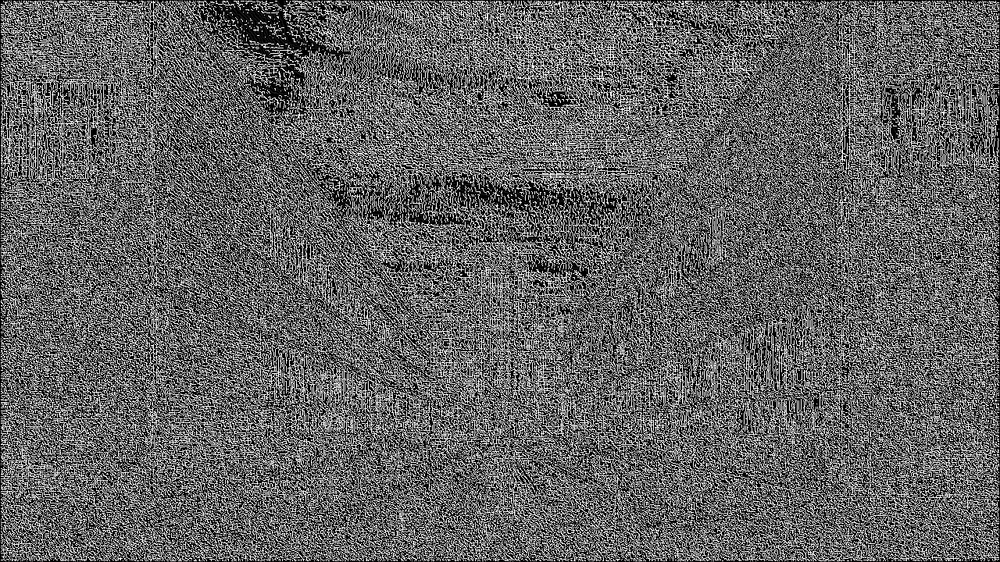

In [18]:
list_images = [image]
list_images.append(complete_process_var_sigma(image, 5))
list_images.append(complete_process_no_gaussian(image))
lista_figuras = ['Original','Sigma 3','Sin remoción de reuido']
fig = px.imshow(np.array(list_images), facet_col=0, binary_string=True,title='Aplicación Canny Detector',facet_col_wrap=3)
for i, titulo in enumerate(lista_figuras):
    fig.layout.annotations[i]['text'] = titulo
fig.show()

En la imagen anterior podemos ver que incluso con una remoción de ruido no muy fuerte (Sigma = 5), podemos observar claramente la forma general del edificion, aunque con bastante ruido en su interior, pero, con sin remoción de ruido se pierde totalmente la utilidad de la imagen resultado, dado que no se puede distinguir ningun objeto.

##  c) Experimenta con imágenes con diferentes cantidad de lineas y textura para observar el comportamiento del algoritmo

Imagen con pocas lineas y texturas


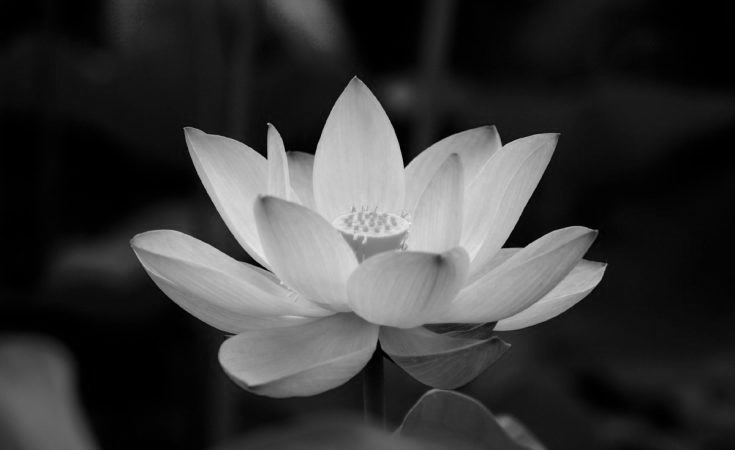
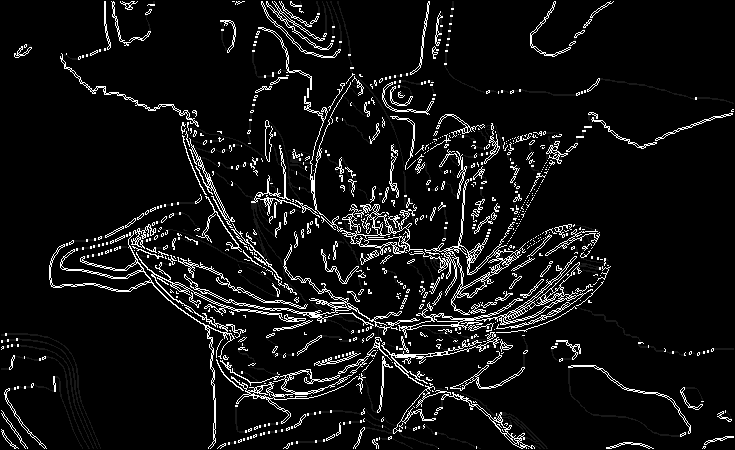
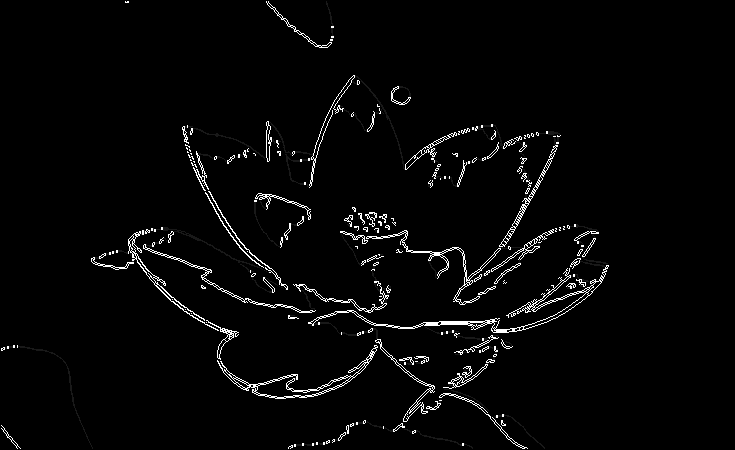
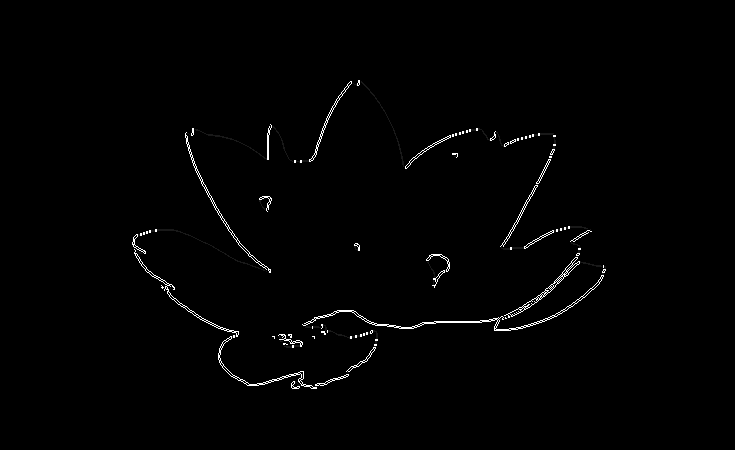

In [19]:
image = io.imread('https://www.mundoflores.net/imagenes/flor-de-loto-735x450.jpg') 
image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
list_images = [image]
sigmas =[5,9,13]
for sigma in sigmas:
    canny_image = complete_process_var_sigma(image, sigma)
    list_images.append(canny_image)
    
lista_figuras = ['Sigma 9','Sigma 13','Original','Sigma 5']
fig = px.imshow(np.array(list_images), facet_col=0, binary_string=True,title='Aplicación Canny Detector',facet_col_wrap=2)
for i, titulo in enumerate(lista_figuras):
    fig.layout.annotations[i]['text'] = titulo
fig.update_layout(height=1000)
fig.show()

Imagen con lineas y texturas de nivel intermedio


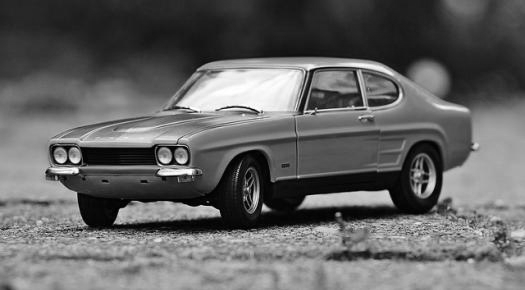
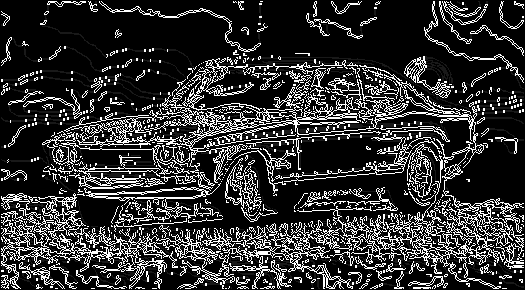
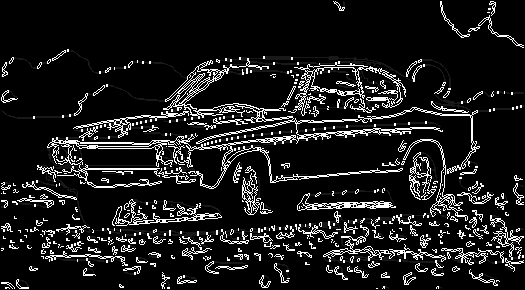
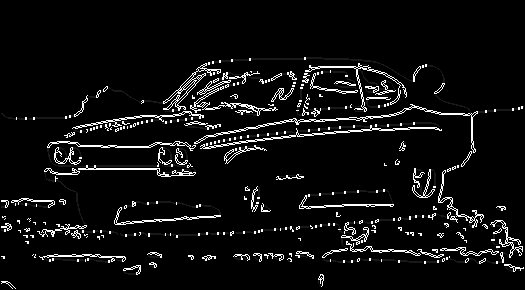

In [20]:
image = io.imread('https://cdn-co.comparabien.com/s3fs-public/styles/blog_page/public/field/image/como%20comprar%20un%20auto%20nuevo.jpg?itok=8kDzXxFk') 
image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
list_images = [image]
sigmas =[5,9,13]
for sigma in sigmas:
    canny_image = complete_process_var_sigma(image, sigma)
    list_images.append(canny_image)
    
lista_figuras = ['Sigma 9','Sigma 13','Original','Sigma 5']
fig = px.imshow(np.array(list_images), facet_col=0, binary_string=True,title='Aplicación Canny Detector',facet_col_wrap=2)
for i, titulo in enumerate(lista_figuras):
    fig.layout.annotations[i]['text'] = titulo
fig.update_layout(height=1000)
fig.show()

Imagen con muchas lineas y texturas


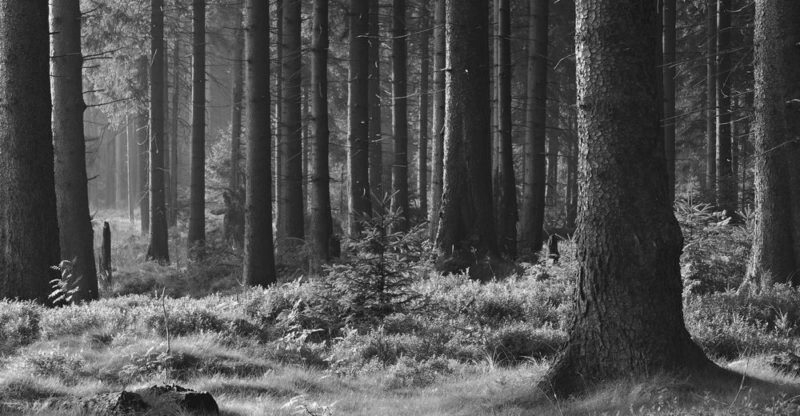
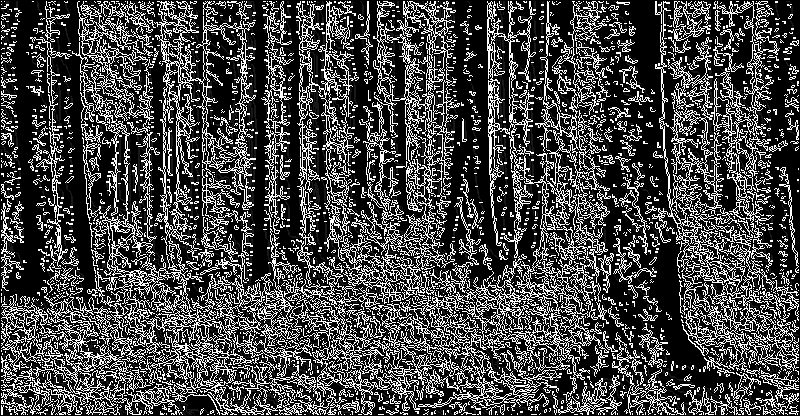
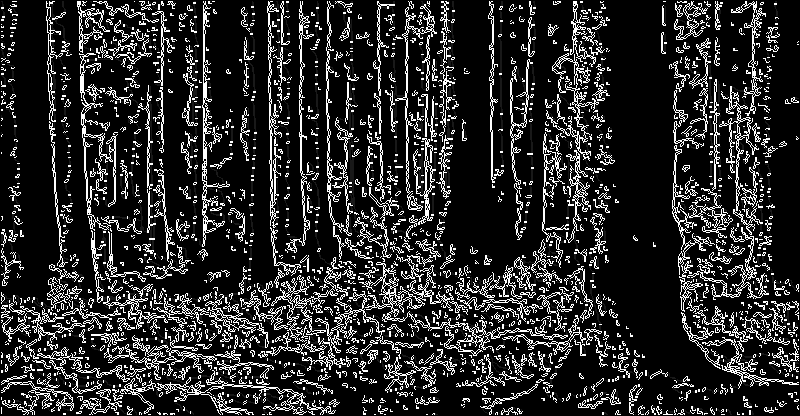
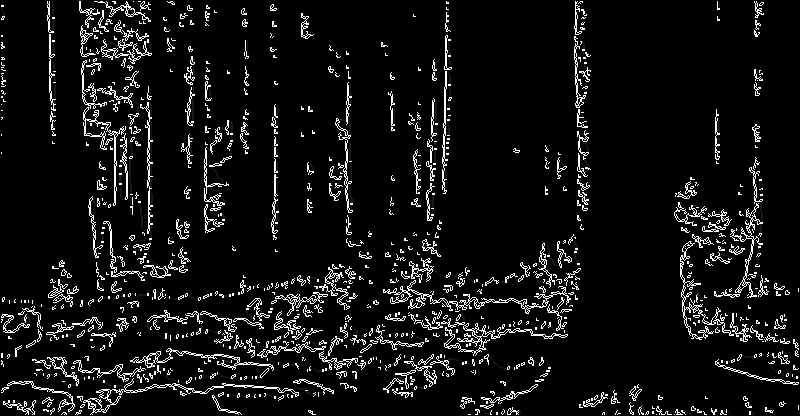

In [21]:
image = io.imread('https://humanidades.com/wp-content/uploads/2018/08/bosque-1-e1577589217640.jpg') 
image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
list_images = [image]
sigmas =[5,9,13]
for sigma in sigmas:
    canny_image = complete_process_var_sigma(image, sigma)
    list_images.append(canny_image)
    
lista_figuras = ['Sigma 9','Sigma 13','Original','Sigma 5']
fig = px.imshow(np.array(list_images), facet_col=0, binary_string=True,title='Aplicación Canny Detector',facet_col_wrap=2)
for i, titulo in enumerate(lista_figuras):
    fig.layout.annotations[i]['text'] = titulo
fig.update_layout(height=1000)
fig.show()

Analizando las imágenes anterior podemos ver que en general el método Canny para extracción de líneas presenta buenos resultados para diferentes tipos de textura y de cantidad de líneas, dado que se puede parametrizar mediante el parámetro Sigma. Sin embargo, vemos que le cuesta un poco más diferencias entre bordes y textura, para imágenes con texturas muy detalladas como la del bosque en la última imágen, mientras que le es más fácil en imágenes con menos textura como la de la flor, en la cual pudo extraer casi de manera perfecta el contorno de sus hojas.

# Bibliografia

[1] Gonzalez R. & Woods R. (2018). Digital Image Processing fourth edition. New York, NY: Pearson.

[2] Xiaoju Ma. (2012). Artificial Intelligence and Computational Intelligence.

[3] J. Canny. (1986) A Computational Approach to Edge Detection. IEEE Transactions on Pattern Analysis and Machine Intelligence, vol. PAMI-8, no. 6, pp. 679-698.





